In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline


In [2]:
df=pd.read_csv(r"C:\Users\ASUS\Desktop\intern exercise\marketing_campaign(customer personality prediction).csv", sep='\t',engine='python')
df.head(2)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0


In [3]:
df.shape

(2240, 29)

In [4]:
df.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

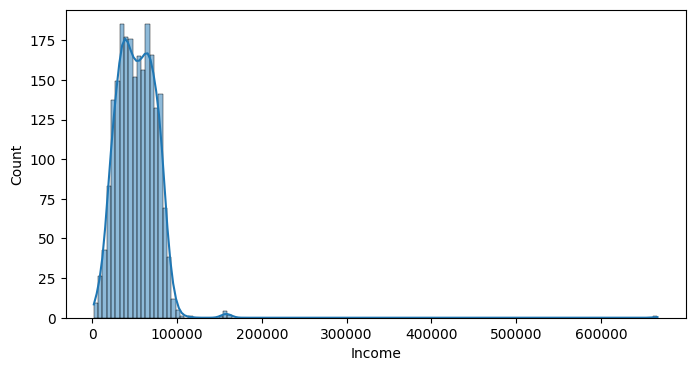

In [5]:
plt.figure(figsize=(8,4))
sns.histplot(x=df['Income'],data=df,kde=True)
plt.show()

In [6]:
df['Income'].median()

51381.5

In [7]:
df['Income']=df['Income'].fillna(df['Income'].median())

In [8]:
df.isnull().sum()

ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
dtype: int64

In [9]:
from ydata_profiling import ProfileReport

In [10]:
pf=ProfileReport(df)
pf

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
df['Year_Birth'].value_counts()

Year_Birth
1976    89
1971    87
1975    83
1972    79
1978    77
1970    77
1973    74
1965    74
1969    71
1974    69
1956    55
1958    53
1979    53
1952    52
1977    52
1968    51
1959    51
1966    50
1954    50
1955    49
1960    49
1982    45
1963    45
1967    44
1962    44
1957    43
1951    43
1983    42
1986    42
1964    42
1980    39
1981    39
1984    38
1961    36
1953    35
1985    32
1989    30
1949    30
1950    29
1988    29
1987    27
1948    21
1990    18
1946    16
1947    16
1991    15
1992    13
1945     8
1943     7
1944     7
1993     5
1995     5
1994     3
1996     2
1899     1
1941     1
1893     1
1900     1
1940     1
Name: count, dtype: int64

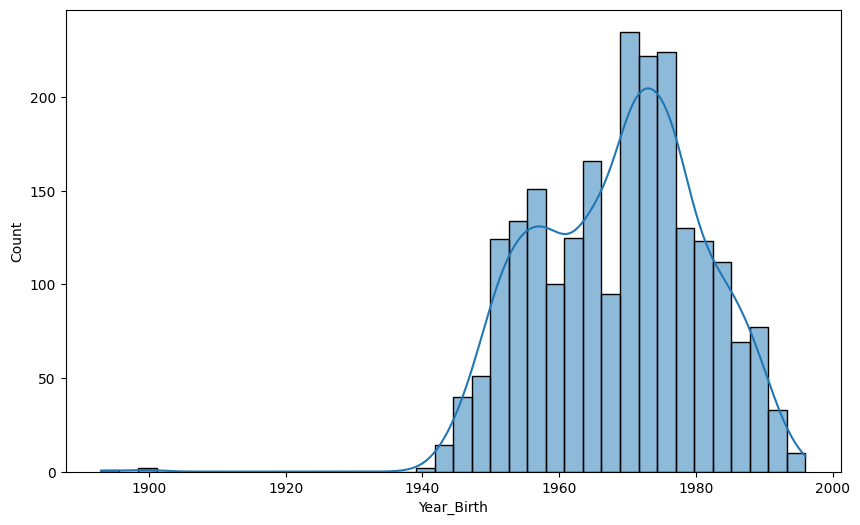

In [12]:
#Distribution of year of birth
plt.figure(figsize=(10,6))
sns.histplot(x=df['Year_Birth'],kde=True)
plt.show()

In [13]:
# calculate the age 
df['Age']=2024-df['Year_Birth']
df['Age']

0       67
1       70
2       59
3       40
4       43
        ..
2235    57
2236    78
2237    43
2238    68
2239    70
Name: Age, Length: 2240, dtype: int64

In [14]:
df.dtypes

ID                       int64
Year_Birth               int64
Education               object
Marital_Status          object
Income                 float64
Kidhome                  int64
Teenhome                 int64
Dt_Customer             object
Recency                  int64
MntWines                 int64
MntFruits                int64
MntMeatProducts          int64
MntFishProducts          int64
MntSweetProducts         int64
MntGoldProds             int64
NumDealsPurchases        int64
NumWebPurchases          int64
NumCatalogPurchases      int64
NumStorePurchases        int64
NumWebVisitsMonth        int64
AcceptedCmp3             int64
AcceptedCmp4             int64
AcceptedCmp5             int64
AcceptedCmp1             int64
AcceptedCmp2             int64
Complain                 int64
Z_CostContact            int64
Z_Revenue                int64
Response                 int64
Age                      int64
dtype: object

In [15]:
# Converting the date string to data and time format
df['Dt_Customer']=pd.to_datetime(df['Dt_Customer'],format='%d-%m-%Y')

In [16]:
#Finding the unique for each column:
df.nunique()

ID                     2240
Year_Birth               59
Education                 5
Marital_Status            8
Income                 1975
Kidhome                   3
Teenhome                  3
Dt_Customer             663
Recency                 100
MntWines                776
MntFruits               158
MntMeatProducts         558
MntFishProducts         182
MntSweetProducts        177
MntGoldProds            213
NumDealsPurchases        15
NumWebPurchases          15
NumCatalogPurchases      14
NumStorePurchases        14
NumWebVisitsMonth        16
AcceptedCmp3              2
AcceptedCmp4              2
AcceptedCmp5              2
AcceptedCmp1              2
AcceptedCmp2              2
Complain                  2
Z_CostContact             1
Z_Revenue                 1
Response                  2
Age                      59
dtype: int64

In [17]:
df=df.drop(columns=['Z_CostContact','Z_Revenue'],axis=1)
df.head(2)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,4,7,0,0,0,0,0,0,1,67
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,2,5,0,0,0,0,0,0,0,70


In [18]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response', 'Age'],
      dtype='object')

In [19]:
df['Education'].value_counts()

Education
Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: count, dtype: int64

In [20]:
df['Education']=df['Education'].replace(['Graduation','PhD','Master','2n Cycle'],'Postgraduation')
df['Education']=df['Education'].replace(['Basic'],'UnderGraduate')

In [21]:
d=df['Education'].value_counts()
d

Education
Postgraduation    2186
UnderGraduate       54
Name: count, dtype: int64

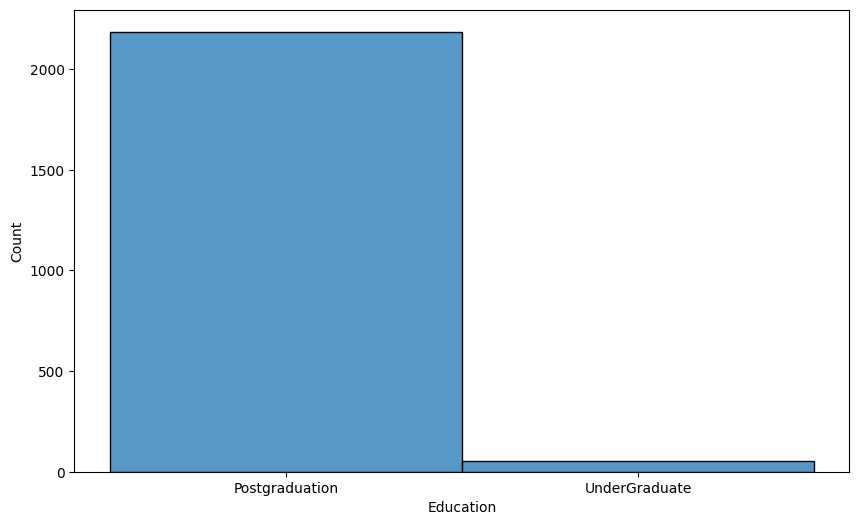

In [22]:
plt.figure(figsize=(10,6))
sns.histplot(x='Education',data=df)
plt.show()

In [23]:
#Marital status;
df['Marital_Status'].value_counts()

Marital_Status
Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: count, dtype: int64

In [24]:
df['Marital_Status']=df['Marital_Status'].replace(['Married','Together'],'Relationship')
df['Marital_Status']=df['Marital_Status'].replace(['Single','Divorced','Widow','Alone','Absurd','YOLO'],'Single')

In [25]:
df['Marital_Status'].value_counts()

Marital_Status
Relationship    1444
Single           796
Name: count, dtype: int64

In [26]:
#Income
df['Income'].describe()

count      2240.000000
mean      52237.975446
std       25037.955891
min        1730.000000
25%       35538.750000
50%       51381.500000
75%       68289.750000
max      666666.000000
Name: Income, dtype: float64

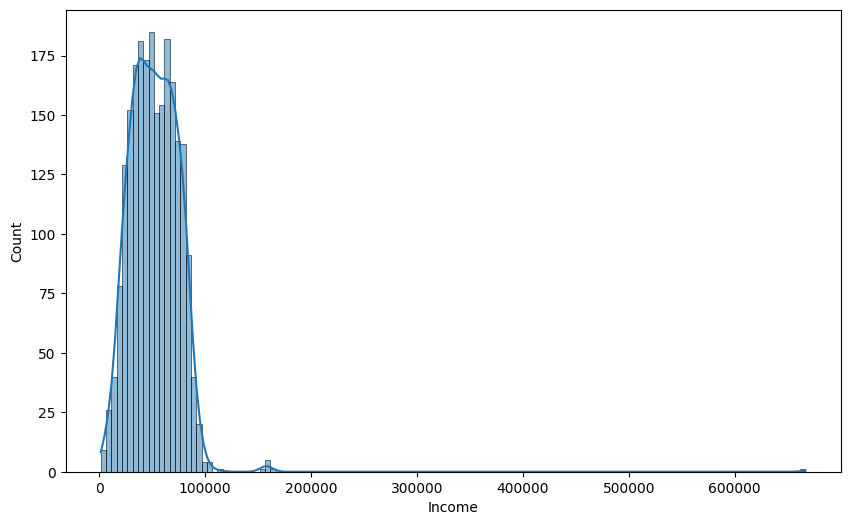

In [27]:
plt.figure(figsize=(10,6))
sns.histplot(x=df['Income'],kde=True)
plt.show()

In [28]:
#kids
df['Kids']=df['Kidhome']+df['Teenhome']

In [29]:
df['Kidhome'].unique()

array([0, 1, 2], dtype=int64)

In [30]:
df['Teenhome'].unique()

array([0, 1, 2], dtype=int64)

In [31]:
df['Kids'].value_counts(normalize=True)*100

Kids
1    50.357143
0    28.482143
2    18.794643
3     2.366071
Name: proportion, dtype: float64

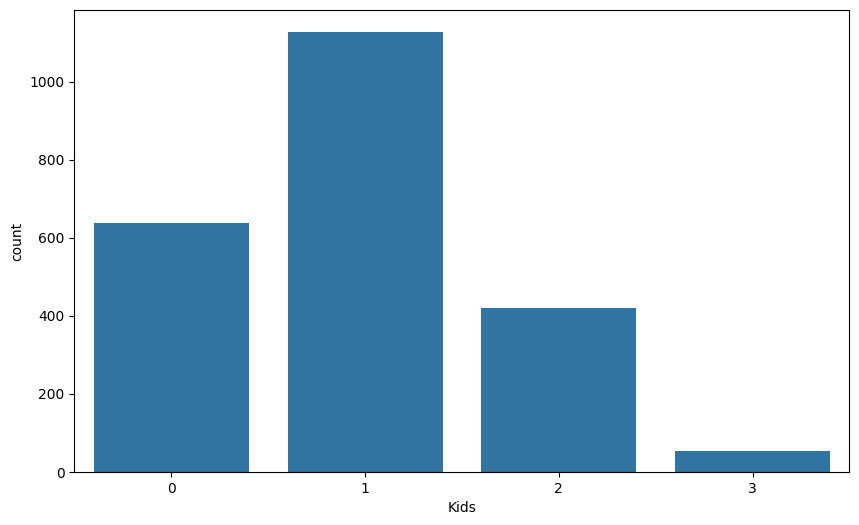

In [32]:
plt.figure(figsize=(10,6))
sns.countplot(x=df['Kids'],data=df)
plt.show()

In [33]:
#amount spends on the products like Wines,Fruits,Meat,Fish,Sweet,gold

In [34]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response', 'Age', 'Kids'],
      dtype='object')

In [35]:
df['Expenses']=df['MntWines']+df['MntFruits']+df['MntMeatProducts']+df['MntFishProducts']+df['MntSweetProducts']+df['MntGoldProds']

In [36]:
df['Expenses'].head()

0    1617
1      27
2     776
3      53
4     422
Name: Expenses, dtype: int64

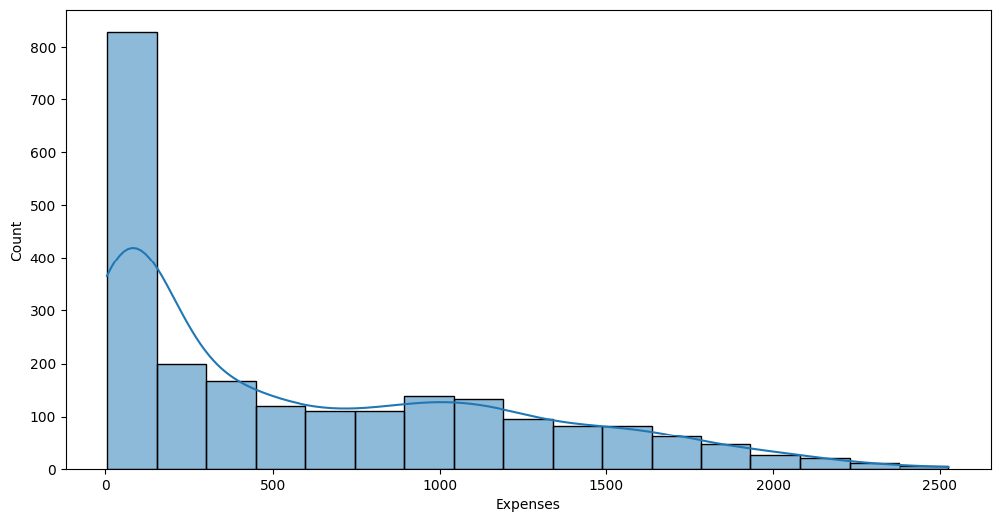

In [37]:
plt.figure(figsize=(12,6))
sns.histplot(df['Expenses'],kde=True)
plt.show()

In [38]:
df['Totalcampattended']=df['AcceptedCmp1']+df['AcceptedCmp2']+df['AcceptedCmp3']+df['AcceptedCmp4']+df['AcceptedCmp5']

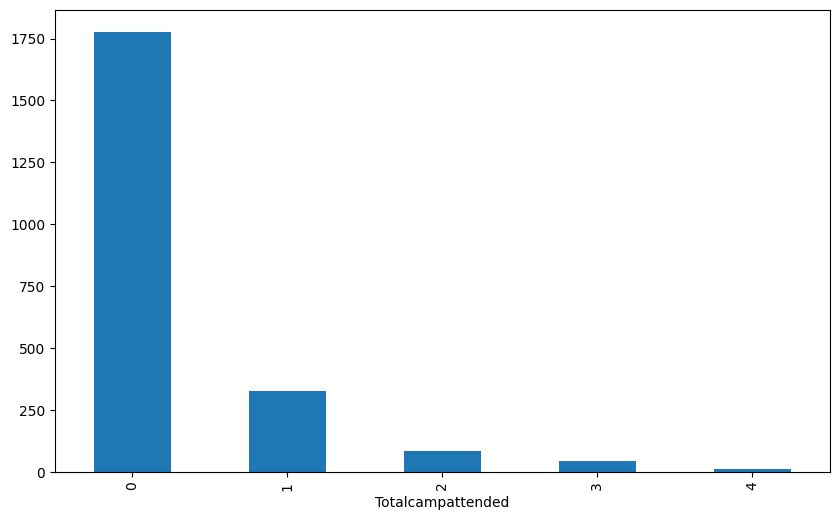

In [39]:
plt.figure(figsize=(10,6))
df['Totalcampattended'].value_counts().plot(kind='bar')
plt.show()

In [40]:
df['Totalpurchase']=df['NumDealsPurchases']+df['NumWebPurchases']+df['NumCatalogPurchases']+df['NumStorePurchases']

In [41]:
df['Totalpurchase'].unique()

array([25,  6, 21,  8, 19, 22, 10,  2,  4, 16, 15,  5, 26,  9, 13, 12, 43,
       17, 20, 14, 27, 11, 18, 28,  7, 24, 29, 23, 32, 30, 37, 31, 33, 35,
       39,  1, 34,  0, 44], dtype=int64)

In [42]:
df['NumDealsPurchases'].unique()

array([ 3,  2,  1,  5,  4, 15,  7,  0,  6,  9, 12,  8, 10, 13, 11],
      dtype=int64)

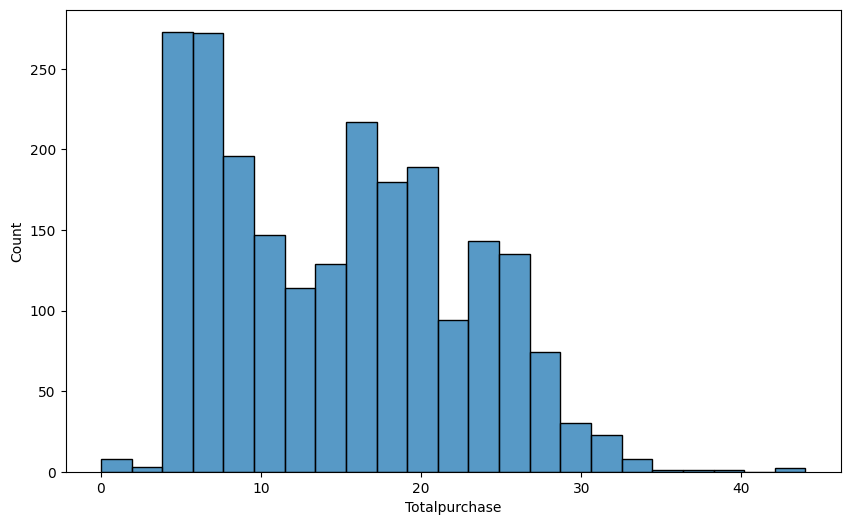

In [43]:
plt.figure(figsize=(10,6))
sns.histplot(df['Totalpurchase'])
plt.show()

In [44]:
df.columns.value_counts()

ID                     1
Year_Birth             1
Totalcampattended      1
Expenses               1
Kids                   1
Age                    1
Response               1
Complain               1
AcceptedCmp2           1
AcceptedCmp1           1
AcceptedCmp5           1
AcceptedCmp4           1
AcceptedCmp3           1
NumWebVisitsMonth      1
NumStorePurchases      1
NumCatalogPurchases    1
NumWebPurchases        1
NumDealsPurchases      1
MntGoldProds           1
MntSweetProducts       1
MntFishProducts        1
MntMeatProducts        1
MntFruits              1
MntWines               1
Recency                1
Dt_Customer            1
Teenhome               1
Kidhome                1
Income                 1
Marital_Status         1
Education              1
Totalpurchase          1
Name: count, dtype: int64

In [45]:
dcolumn=['Year_Birth','Kidhome','Teenhome','MntWines', 'MntFruits','MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases','NumCatalogPurchases', 'NumStorePurchases','AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2']

In [46]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Kids,Expenses,Totalcampattended,Totalpurchase
0,5524,1957,Postgraduation,Single,58138.0,0,0,2012-09-04,58,635,...,0,0,0,0,1,67,0,1617,0,25
1,2174,1954,Postgraduation,Single,46344.0,1,1,2014-03-08,38,11,...,0,0,0,0,0,70,2,27,0,6
2,4141,1965,Postgraduation,Relationship,71613.0,0,0,2013-08-21,26,426,...,0,0,0,0,0,59,0,776,0,21
3,6182,1984,Postgraduation,Relationship,26646.0,1,0,2014-02-10,26,11,...,0,0,0,0,0,40,1,53,0,8
4,5324,1981,Postgraduation,Relationship,58293.0,1,0,2014-01-19,94,173,...,0,0,0,0,0,43,1,422,0,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Postgraduation,Relationship,61223.0,0,1,2013-06-13,46,709,...,0,0,0,0,0,57,1,1341,0,18
2236,4001,1946,Postgraduation,Relationship,64014.0,2,1,2014-06-10,56,406,...,0,1,0,0,0,78,3,444,1,22
2237,7270,1981,Postgraduation,Single,56981.0,0,0,2014-01-25,91,908,...,0,0,0,0,0,43,0,1241,1,19
2238,8235,1956,Postgraduation,Relationship,69245.0,0,1,2014-01-24,8,428,...,0,0,0,0,0,68,1,843,0,23


In [47]:
df=df.drop(columns=dcolumn,axis=1)

In [48]:
df['Dt_Customer']=pd.to_datetime(df['Dt_Customer'])

In [49]:

dates=[]
for i in df['Dt_Customer']:
    i=i.date()
    dates.append(i)
print('oldest customer enrollment:',min(dates))
print('newest customer enrollment:',max(dates))

oldest customer enrollment: 2012-07-30
newest customer enrollment: 2014-06-29


In [50]:
# finding the customers days;
days=[]
maxdate=max(dates)
for i in dates:
    f=maxdate-i
    days.append(f)
df['customers_from']=days
df['customers_from']=df['customers_from'].apply(lambda x:x.days)

In [51]:
df['customers_from']

0       663
1       113
2       312
3       139
4       161
       ... 
2235    381
2236     19
2237    155
2238    156
2239    622
Name: customers_from, Length: 2240, dtype: int64

In [52]:
df['customers_from'].describe()

count    2240.000000
mean      353.582143
std       202.122512
min         0.000000
25%       180.750000
50%       355.500000
75%       529.000000
max       699.000000
Name: customers_from, dtype: float64

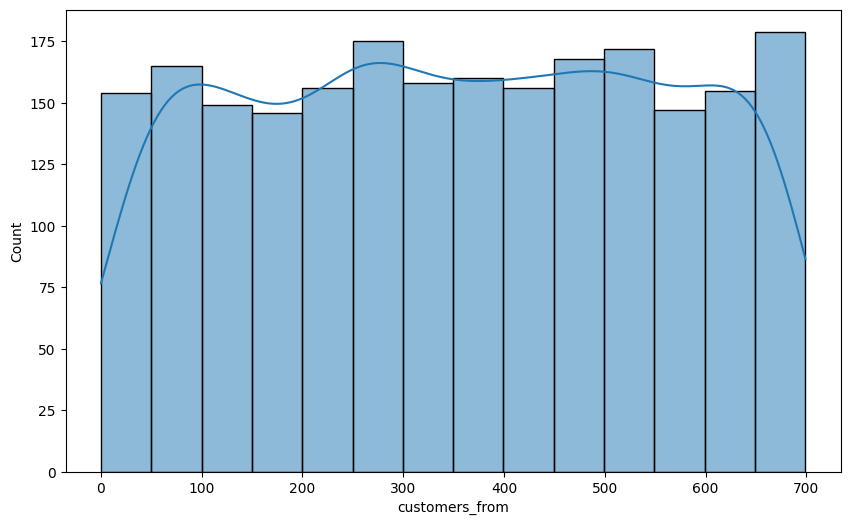

In [53]:
plt.figure(figsize=(10,6))
sns.histplot(df['customers_from'],kde=True)
plt.show()

In [54]:
df.drop(columns=['Dt_Customer','Response','Recency','Complain'],axis=1,inplace=True)

In [55]:
df.columns

Index(['ID', 'Education', 'Marital_Status', 'Income', 'NumWebVisitsMonth',
       'Age', 'Kids', 'Expenses', 'Totalcampattended', 'Totalpurchase',
       'customers_from'],
      dtype='object')

In [56]:
df.shape

(2240, 11)

In [57]:
df.dtypes

ID                     int64
Education             object
Marital_Status        object
Income               float64
NumWebVisitsMonth      int64
Age                    int64
Kids                   int64
Expenses               int64
Totalcampattended      int64
Totalpurchase          int64
customers_from         int64
dtype: object

In [58]:
df.head()

,ID,Education,Marital_Status,Income,NumWebVisitsMonth,Age,Kids,Expenses,Totalcampattended,Totalpurchase,customers_from
0,5524,Postgraduation,Single,58138.0,7,67,0,1617,0,25,663
1,2174,Postgraduation,Single,46344.0,5,70,2,27,0,6,113
2,4141,Postgraduation,Relationship,71613.0,4,59,0,776,0,21,312
3,6182,Postgraduation,Relationship,26646.0,6,40,1,53,0,8,139
4,5324,Postgraduation,Relationship,58293.0,5,43,1,422,0,19,161


In [59]:
df['Totalpurchase'].describe()

count    2240.000000
mean       14.862054
std         7.677173
min         0.000000
25%         8.000000
50%        15.000000
75%        21.000000
max        44.000000
Name: Totalpurchase, dtype: float64

In [60]:
df=df.drop(columns=['NumWebVisitsMonth'],axis=1)

In [61]:
df.shape

(2240, 10)

Bivariate Analysis

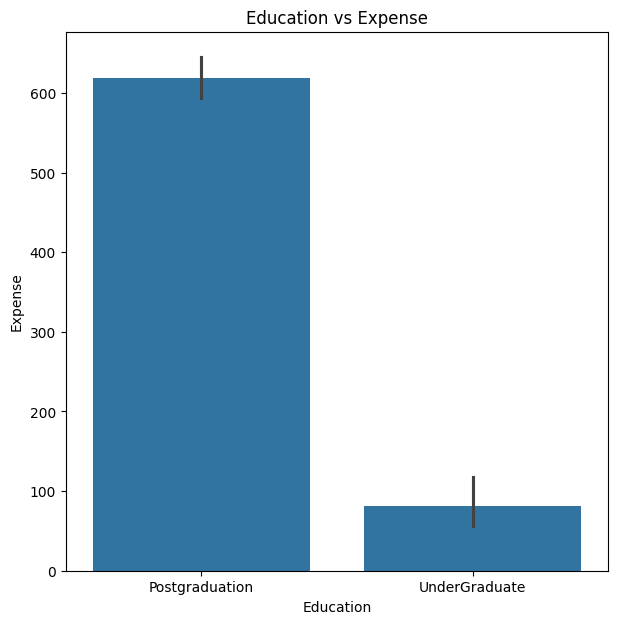

In [62]:
#Education vs Expense:
plt.figure(figsize=(7,7))
plt.title('Education vs Expense')
sns.barplot(x=df[ 'Education'],y=df['Expenses'],data=df)
plt.xlabel('Education')
plt.ylabel('Expense')
plt.show()

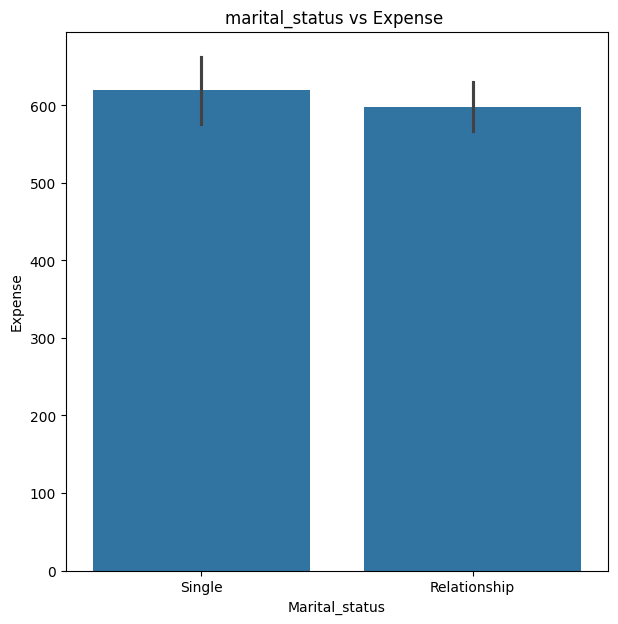

In [63]:
#Education vs marital_status:
plt.figure(figsize=(7,7))
plt.title('marital_status vs Expense ')
sns.barplot(x=df['Marital_Status'],y=df['Expenses'],data=df)
plt.xlabel('Marital_status')
plt.ylabel('Expense')
plt.show()

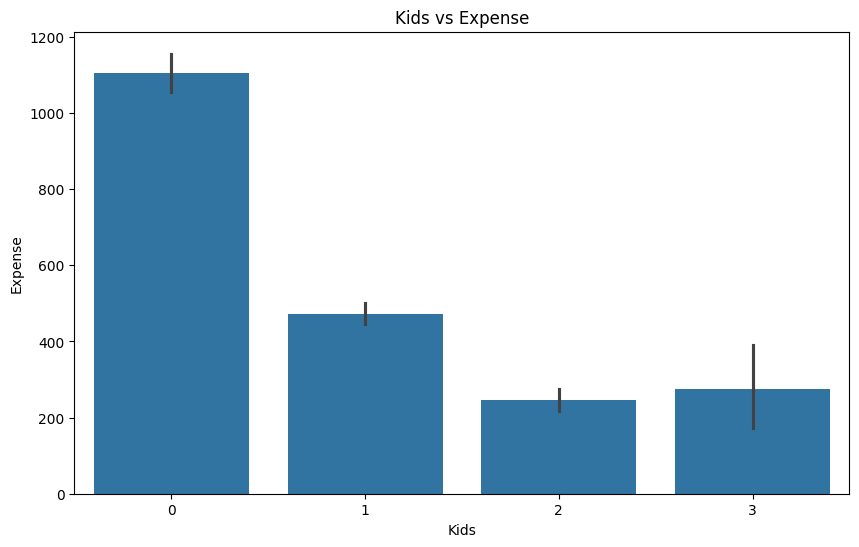

In [64]:
#Kids vs Expense:
plt.figure(figsize=(10,6))
plt.title('Kids vs Expense')
sns.barplot(x=df['Kids'],y=df['Expenses'],data=df)
plt.xlabel('Kids')
plt.ylabel('Expense')
plt.show()

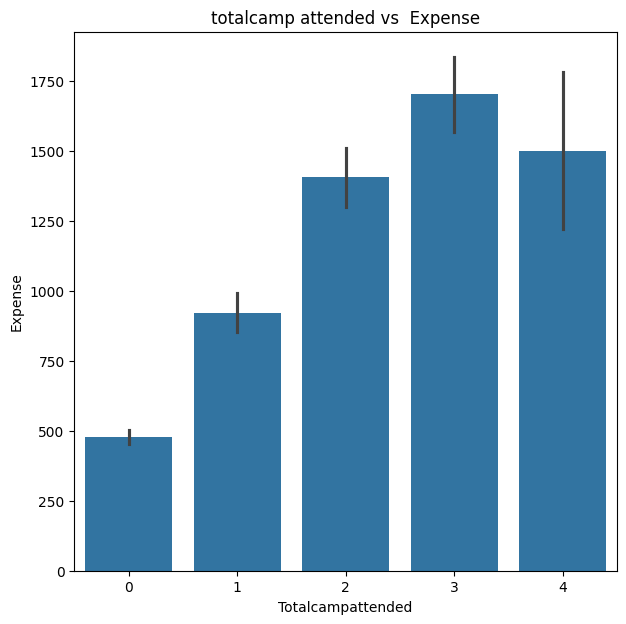

In [65]:
#total camp attended vs  Expense:
plt.figure(figsize=(7,7))
plt.title('totalcamp attended vs  Expense')
sns.barplot(x=df['Totalcampattended'],y=df['Expenses'],data=df)
plt.xlabel('Totalcampattended')
plt.ylabel('Expense')
plt.show()

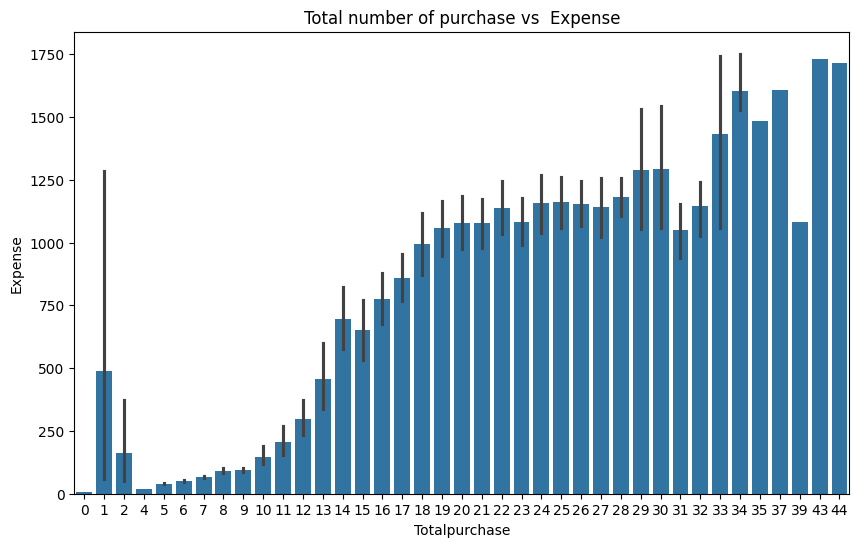

In [66]:
#total number of purchase vs  Expense:
plt.figure(figsize=(10,6))
plt.title('Total number of purchase vs  Expense')
sns.barplot(x=df['Totalpurchase'],y=df['Expenses'],data=df)
plt.xlabel('Totalpurchase')
plt.ylabel('Expense')
plt.show()

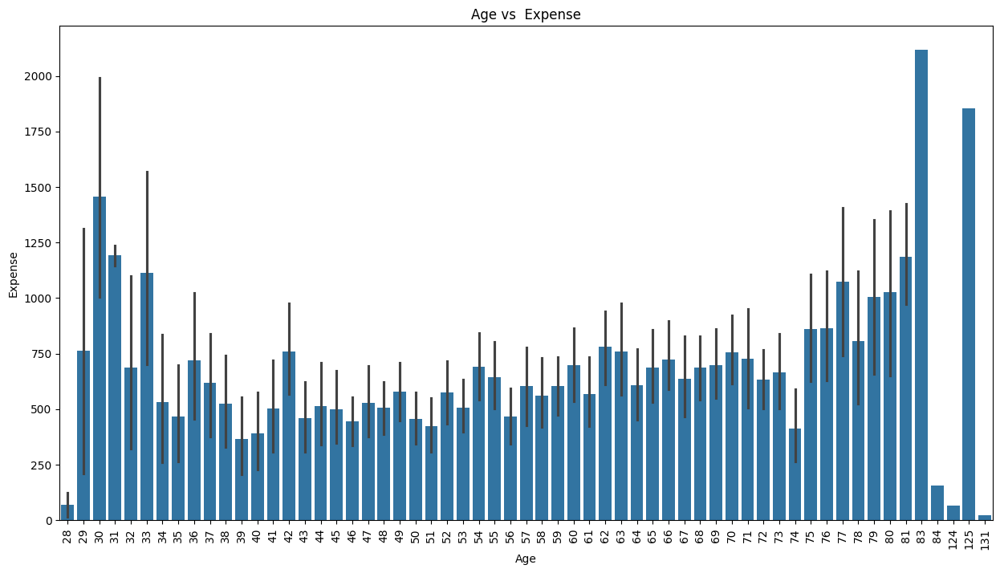

In [67]:
#Age vs Expense:
plt.figure(figsize=(15,8))
plt.title('Age vs  Expense')
sns.barplot(x=df['Age'],y=df['Expenses'],data=df)
plt.xticks(rotation=90)
plt.xlabel('Age')
plt.ylabel('Expense')
plt.show()

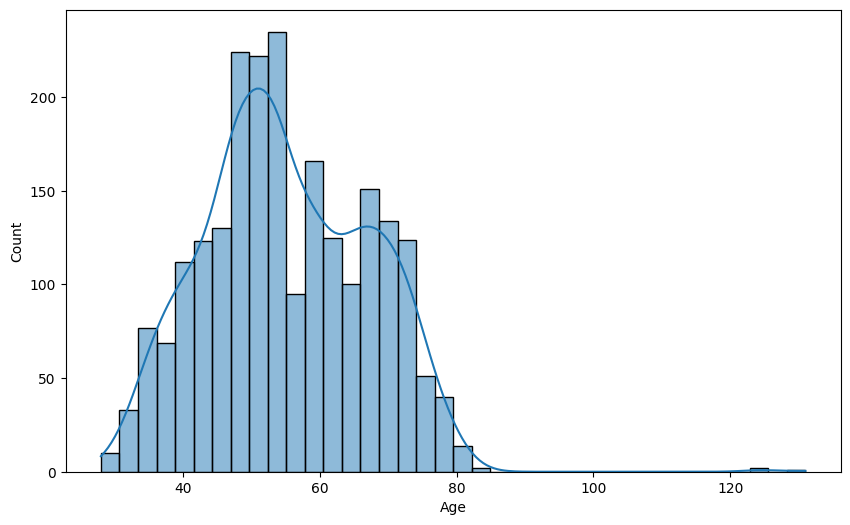

In [68]:
#we are removing the outliers:
plt.figure(figsize=(10,6))
sns.histplot(df['Age'],kde=True)
plt.show()

we are having the outliers values so we need to remove it 

In [69]:
df['Age'].describe()

count    2240.000000
mean       55.194196
std        11.984069
min        28.000000
25%        47.000000
50%        54.000000
75%        65.000000
max       131.000000
Name: Age, dtype: float64

In [70]:
df=df[df['Age']< 90]

In [71]:
df['Income'].describe()

count      2237.000000
mean      52227.407689
std       25043.266830
min        1730.000000
25%       35523.000000
50%       51381.500000
75%       68281.000000
max      666666.000000
Name: Income, dtype: float64

In [72]:
df=df[df['Income'] < 200000]

In [73]:
df.shape

(2236, 10)

In [74]:
df.to_csv('coustomer3.csv')

In [75]:
# we are using labelencoder for converting the string to numerical

from sklearn.preprocessing import LabelEncoder

In [76]:
model=LabelEncoder()

In [77]:
df['Education']=model.fit_transform(df['Education'])

In [78]:
df.columns

Index(['ID', 'Education', 'Marital_Status', 'Income', 'Age', 'Kids',
       'Expenses', 'Totalcampattended', 'Totalpurchase', 'customers_from'],
      dtype='object')

In [79]:
df['Marital_Status']=model.fit_transform(df['Marital_Status'])

In [80]:
df.head()

,ID,Education,Marital_Status,Income,Age,Kids,Expenses,Totalcampattended,Totalpurchase,customers_from
0,5524,0,1,58138.0,67,0,1617,0,25,663
1,2174,0,1,46344.0,70,2,27,0,6,113
2,4141,0,0,71613.0,59,0,776,0,21,312
3,6182,0,0,26646.0,40,1,53,0,8,139
4,5324,0,0,58293.0,43,1,422,0,19,161


In [81]:
df=df.drop(columns=['ID'])

In [82]:
df.to_csv('coustomer2.csv',index=False)

In [83]:
import os

In [84]:
os.getcwd()

'C:\\Users\\ASUS'

In [85]:
df1=pd.read_csv(r"C:\Users\ASUS\coustomer2.csv")

In [86]:
from sklearn.preprocessing import StandardScaler

In [87]:
m1=StandardScaler()

In [88]:
numeric=[ 'Income', 'Kids','Expenses', 'Totalcampattended', 'Totalpurchase', 'customers_from']

In [89]:
x=df1[numeric]

In [90]:
scaled=m1.fit_transform(x)

In [91]:
from sklearn.cluster import KMeans


#To find the number of clusters use Elbow method :

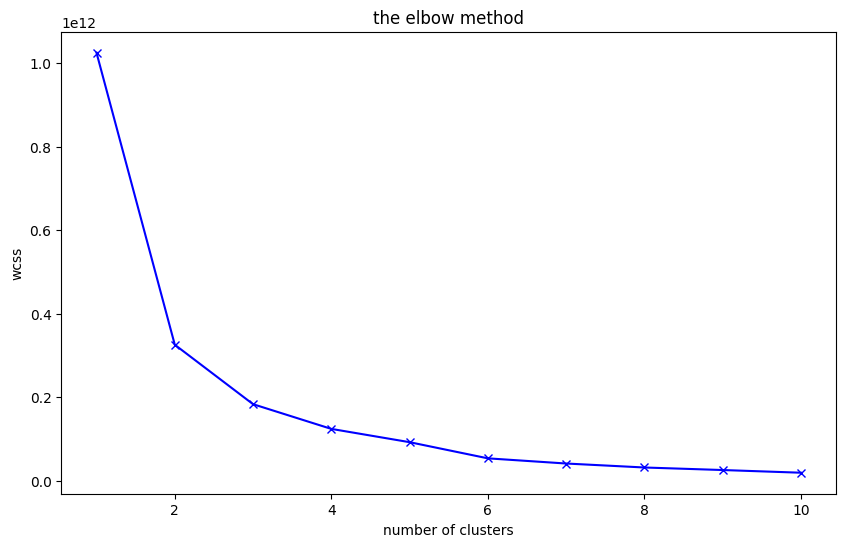

In [92]:
wcss=[]
for i in range (1,11):
    kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)
    kmeans.fit(df1)
    wcss.append(kmeans.inertia_)
plt.figure(figsize=(10,6))
plt.plot(range(1,11),wcss,'bx-')
plt.title('the elbow method')
plt.xlabel('number of clusters')
plt.ylabel('wcss')
plt.show()

In [93]:
#Using the kmeans algorithm:
kmeans=KMeans(n_clusters=2,random_state=42)
df1['outcome']=kmeans.fit_predict(scaled)

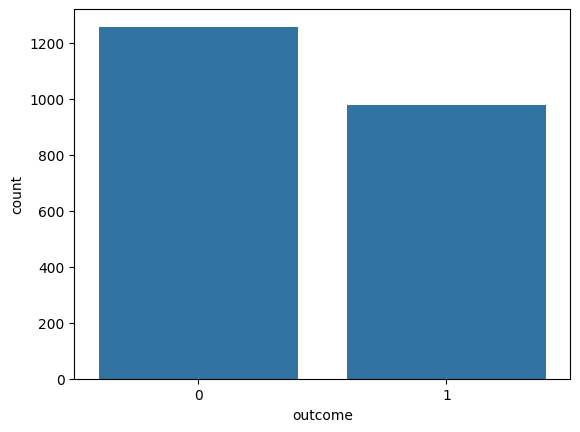

In [94]:
sns.countplot(x=df1['outcome'])
plt.show()

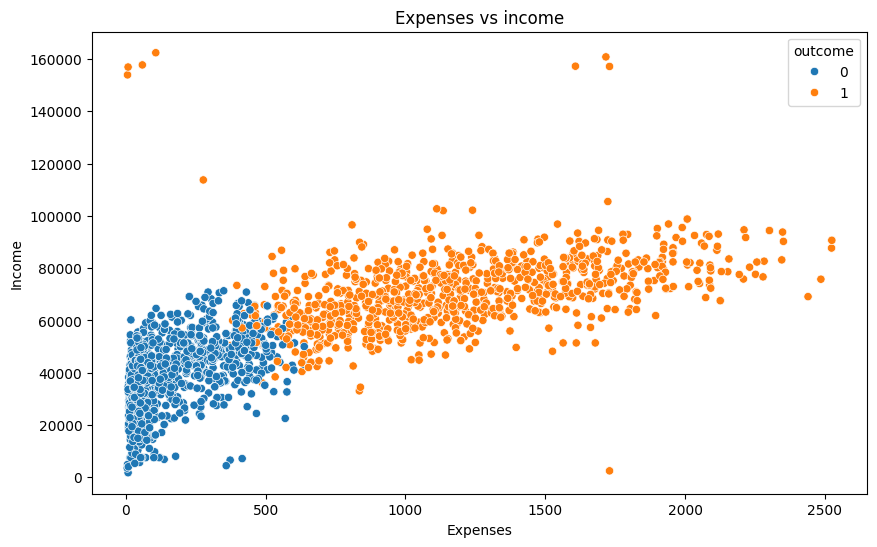

In [95]:
plt.figure(figsize=(10,6))
sns.scatterplot(x=df1['Expenses'],y=df1['Income'],hue=df1['outcome'])
plt.title('Expenses vs income')
plt.show()

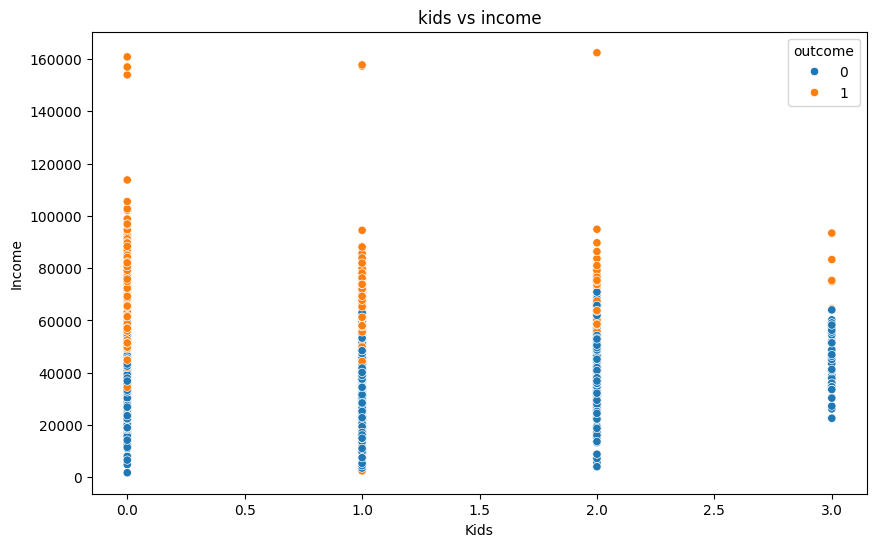

In [96]:
plt.figure(figsize=(10,6))
sns.scatterplot(x=df1['Kids'],y=df1['Income'],hue=df1['outcome'])
plt.title('kids vs income')
plt.show()

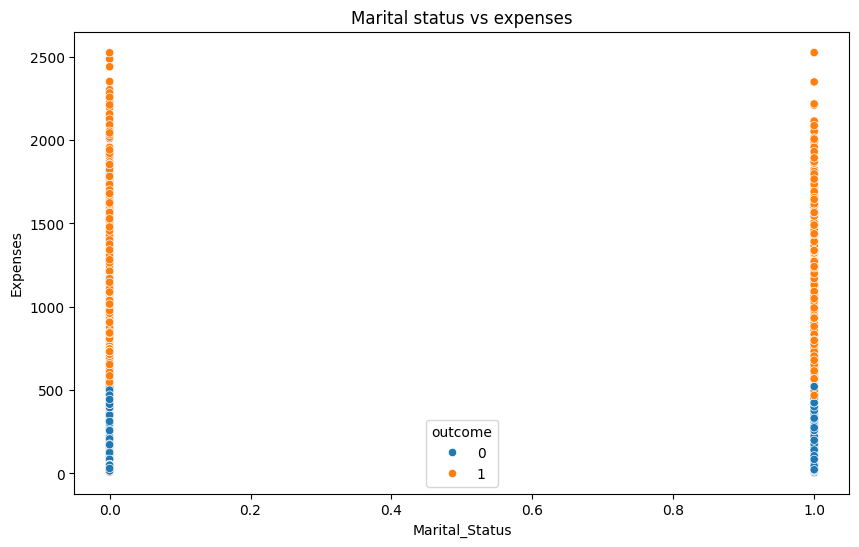

In [97]:
plt.figure(figsize=(10,6))
sns.scatterplot(x=df1['Marital_Status'],y=df1['Expenses'],hue=df1['outcome'])
plt.title('Marital status vs expenses')
plt.show()

In [98]:
df1.head(2)

,Education,Marital_Status,Income,Age,Kids,Expenses,Totalcampattended,Totalpurchase,customers_from,outcome
0,0,1,58138.0,67,0,1617,0,25,663,1
1,0,1,46344.0,70,2,27,0,6,113,0


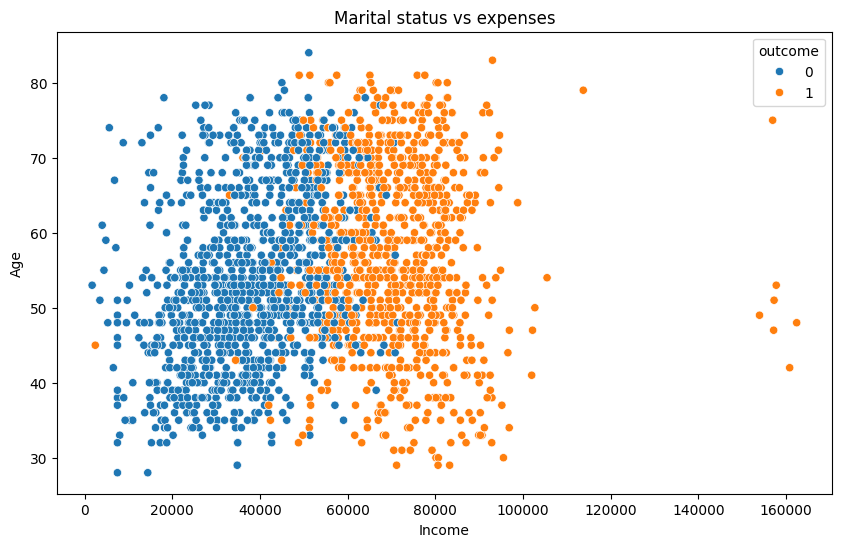

In [99]:
plt.figure(figsize=(10,6))
sns.scatterplot(x=df1['Income'],y=df1['Age'],hue=df1['outcome'])
plt.title('Marital status vs expenses')
plt.show()

## Customer Analysis prediction
#### Here we have two clusters
##### 0 = The people who have less Expense 
 - The people who are having more kids they have less expenses
 - The people who were married have less expenses
 - The people who has low income they have less expenses
##### 1 = The people who have more  Expense 
 - The people who are having less kids they have more expenses
 - The people who were single have more expenses
 - The people who have high income have more expenses

## NOTE:
**So the Cunstomer Who are in 2nd clusters**
 - They spend more
### So When you are Launching the new products you must focus on the cluster 2